In [1]:
# Import Statements
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2
import glob
from skimage.feature import hog

%matplotlib inline

### Data Exploration

In [2]:
# Import Training Data
car_filenames = glob.glob('dataset/vehicles/*/*.png')
noncar_filenames = glob.glob('dataset/non-vehicles/*/*.png')
car_datasize = len(car_filenames)
noncar_datasize = len(noncar_filenames)
print(car_datasize, noncar_datasize)

8792 8968


Text(0.5,1,'not car')

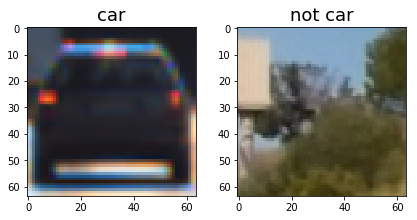

In [3]:
# Data Look
car_image = mpimg.imread(car_filenames[np.random.randint(car_datasize)])
noncar_image = mpimg.imread(noncar_filenames[np.random.randint(noncar_datasize)])

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(6, 6))
f.tight_layout()
ax1.imshow(car_image)
ax1.set_title('car', fontsize=18)
ax2.imshow(noncar_image)
ax2.set_title('not car', fontsize=18)

### HOG

Text(0.5,1,'not car HOG')

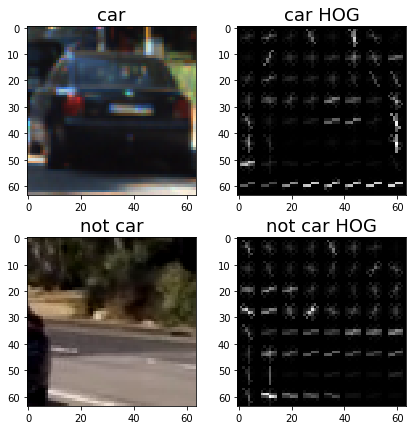

In [4]:
# Hog Data Look
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, 
                     feature_vec=True):
    return hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), block_norm='L2',
                                  transform_sqrt=False, visualise= vis, feature_vector= feature_vec,)
    
car_image = mpimg.imread(car_filenames[np.random.randint(car_datasize)])
car_gray = cv2.cvtColor(car_image, cv2.COLOR_RGB2GRAY)
noncar_image = mpimg.imread(noncar_filenames[np.random.randint(noncar_datasize)])
noncar_gray = cv2.cvtColor(noncar_image, cv2.COLOR_RGB2GRAY)

features, car_hog = get_hog_features(car_gray, orient= 9, 
                        pix_per_cell= 8, cell_per_block= 2, 
                        vis=True, feature_vec=False)
features, noncar_hog = get_hog_features(noncar_gray, orient= 9, 
                        pix_per_cell= 8, cell_per_block= 3, 
                        vis=True, feature_vec=False)

f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(6, 6))
f.tight_layout()
ax1.imshow(car_image)
ax1.set_title('car', fontsize=18)
ax2.imshow(car_hog, cmap='gray')
ax2.set_title('car HOG', fontsize=18)
ax3.imshow(noncar_image)
ax3.set_title('not car', fontsize=18)
ax4.imshow(noncar_hog, cmap='gray')
ax4.set_title('not car HOG', fontsize=18)

In [5]:
def color_hist(img, nbins=32, bins_range=(0, 1)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features


# Extract Features
def extract_features(imgs, cspace='RGB', orient=9, pix_per_cell=8, cell_per_block=2, hog_channels=(0, )):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if cspace != 'RGB':
            if cspace == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif cspace == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif cspace == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif cspace == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
        else: feature_image = np.copy(image)      
        # Apply get_hog_features() to extract shape features
        hog_features = np.ravel([get_hog_features(feature_image[:,:,channel],
                                        orient, pix_per_cell, cell_per_block,
                                        vis=False, feature_vec=True) 
                        for channel in hog_channels])
        color_features = color_hist(image)
        features.append(np.concatenate((hog_features, color_features)))
    return np.array(features)

In [6]:
# Parameter exploration for feature extraction function
from sklearn.model_selection import train_test_split
import pandas as pd
import time
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler

fe_col = ['Colorspace', 'Orientations', 'Pixels Per Cell', 'Cells Per Block',
                           'HOG Channel', 'Extract Time', 'Accuracy', 'Training time']

params = [
    ['RGB', 9, 16, 2, [0, 1, 2]],
    ['HSV', 9, 16, 3, [0, 2]],
    ['LUV', 6, 8, 2, [1]],
    ['LUV', 6, 8, 2, [0]],
    ['HLS', 10, 16, 3, [0,1,2]],
    ['HLS', 12, 12, 2, [0, 1, 2]],
    ['YUV', 6, 8, 2, [0]],
    ['YUV', 9, 8, 2, [0,1,2]],
    ['YUV', 11, 16, 2, [0,1,2]],
    ['YUV', 11, 16, 4, [0,1,2]],
    ['YUV', 9, 16, 2, [0]],
    ['YUV', 12, 16, 3, [1,2,]],
]

filenames = np.hstack((np.array(car_filenames), np.array(noncar_filenames)))
ind = np.random.choice(len(filenames), int(len(filenames) * 0.2))
y_all = np.hstack((np.ones(car_datasize), np.zeros(noncar_datasize)))

In [7]:
result = []

for p in params[:]:
    # Extract hog features
    start = time.time()
    X = extract_features(filenames[ind], *p)
    end = time.time()
    extract_time = round(end-start, 2)
    
    # Training
    scaler = StandardScaler()
    X = scaler.fit_transform(X)
    
    y = y_all[ind]
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3)
    svc = LinearSVC()
    start = time.time()
    svc.fit(X_train, y_train)
    end = time.time()
    training_time = round(end-start, 2)
    accuracy = svc.score(X_test, y_test)
    
    result.append(p + [extract_time, accuracy, training_time])


df = pd.DataFrame(result, columns=fe_col)
df

,Colorspace,Orientations,Pixels Per Cell,Cells Per Block,HOG Channel,Extract Time,Accuracy,Training time
0,RGB,9,16,2,"[0, 1, 2]",11.03,0.976548,0.48
1,HSV,9,16,3,"[0, 2]",7.19,0.986867,0.34
2,LUV,6,8,2,[1],7.04,0.938086,1.28
3,LUV,6,8,2,[0],6.89,0.973734,1.03
4,HLS,10,16,3,"[0, 1, 2]",9.53,0.984053,0.58
5,HLS,12,12,2,"[0, 1, 2]",11.35,0.984053,2.38
6,YUV,6,8,2,[0],6.99,0.961538,0.98
7,YUV,9,8,2,"[0, 1, 2]",16.31,0.985929,7.28
8,YUV,11,16,2,"[0, 1, 2]",10.85,0.990619,0.75
9,YUV,11,16,4,"[0, 1, 2]",10.31,0.988743,0.34


In [8]:
df.to_pickle('./param_explore.pkl.xz')

In [9]:
from sklearn.externals import joblib

best_param = params[8]

X = extract_features(filenames, *best_param)
scaler = StandardScaler()
X = scaler.fit_transform(X)
y = y_all
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3)
svc = LinearSVC()
svc.fit(X_train, y_train)
accuracy = svc.score(X_test, y_test)

print("Accuracy on test dataset: {}".format(accuracy))

joblib.dump(svc, './best_svm.pkl')
joblib.dump(scaler, './scaler.pkl')

Accuracy on test dataset: 0.9891141141141141


['./scaler.pkl']

### Sliding window

In [10]:
from sklearn.externals import joblib

svc = joblib.load('./best_svm.pkl')
scaler = joblib.load('./scaler.pkl')
best_param = params[8]

In [11]:
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    c = color
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        if color is None:
            c = (np.random.randint(0, 256), np.random.randint(0, 256), np.random.randint(0, 256), )
        cv2.rectangle(imcopy, bbox[0], bbox[1], c, thick)
    # Return the image copy with boxes drawn
    return imcopy

In [12]:
from sklearn.externals import joblib

def find_cars(img, ystart, ystop, scale, svc, cspace, orient, pix_per_cell, cell_per_block, hog_channels,
             show_all_cubes=False):
    img = img.astype(np.float32)/255

    img_tosearch = img[ystart:ystop,:,:]

    if cspace != 'RGB':
        if cspace == 'HSV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HSV)
        elif cspace == 'LUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2LUV)
        elif cspace == 'HLS':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HLS)
        elif cspace == 'YUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YUV)
    else: 
        ctrans_tosearch = np.copy(img_tosearch)
        
    # rescale image if other than 1.0 scale
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))

    chs = []   # channels
    for ch in hog_channels:
        ch_data = ctrans_tosearch[:,:,ch]
        chs.append(ch_data)
    
    # Define blocks and steps as above
    nxblocks = (chs[0].shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (chs[0].shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = window // pix_per_cell // 4  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1

    if not show_all_cubes:
        # Compute individual channel HOG features for the entire image
        hogs = []
        for ch_data in chs:
            hog = get_hog_features(ch_data, orient, pix_per_cell, cell_per_block, feature_vec=False)
            hogs.append(hog)
    
    ret = []
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            
            if not show_all_cubes:
                # Extract HOG for this patch
                hog_feats = []
                for hog in hogs:
                    hog_feat = hog[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                    hog_feats.append(hog_feat)
                hog_features = np.hstack(hog_feats)

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            
            if not show_all_cubes:
                # Extract the image patch
                subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))

                # Get color features
                hist_features = color_hist(subimg)

            test_prediction = 1
            if not show_all_cubes:
                test_features = np.hstack((hog_features, hist_features)).reshape(1, -1)
                test_features = scaler.transform(test_features)
                
                test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                retangle = ((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart))
                ret.append(retangle)
                
    return ret

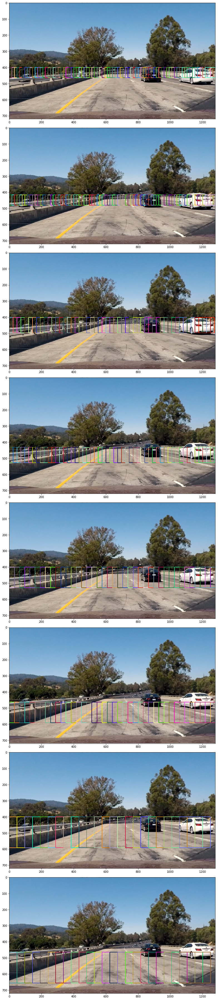

In [13]:
pos_and_scale = [
    [400, 465, 1.],
    [415, 490, 1.],
    [400, 500, 1.5],
    [432, 532, 1.5],
    [400, 550, 2.],
    [464, 620, 2.],
    [400, 600, 3.],
    [464, 664, 3.],
]

image = mpimg.imread('test_images/test1.jpg')
f, plots = plt.subplots(len(pos_and_scale), 1, figsize=(50, 50))
f.tight_layout()

for i in range(len(pos_and_scale)):
    ps = pos_and_scale[i]
    retangles = find_cars(image, *((ps + [svc] + best_param)), True)
    result = draw_boxes(image, retangles, None, 2)
    plots[i].imshow(result)

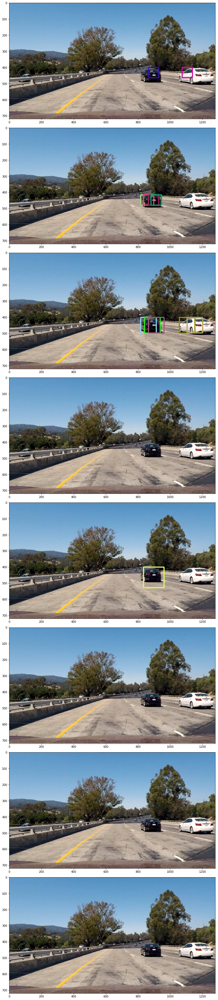

In [14]:
f, plots = plt.subplots(len(pos_and_scale), 1, figsize=(50, 50))
f.tight_layout()

all_found = []
for i in range(len(pos_and_scale)):
    ps = pos_and_scale[i]
    retangles = find_cars(image, *((ps + [svc] + best_param)), False)
    all_found.append(retangles)
    result = draw_boxes(image, retangles, None)
    plots[i].imshow(result)

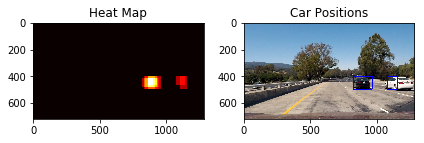

In [15]:
from scipy.ndimage.measurements import label

heat = np.zeros_like(image[:,:,0]).astype(np.float)

def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

box_list = [rect for rects in all_found for rect in rects]
# Add heat to each box in box list
heat = add_heat(heat,box_list)
    
# Apply threshold to help remove false positives
heat = apply_threshold(heat, 1)

# Visualize the heatmap when displaying    
heatmap = np.clip(heat, 0, 255)

# Find final boxes from heatmap using label function
labels = label(heatmap)
draw_img = draw_labeled_bboxes(np.copy(image), labels)

fig = plt.figure()
plt.subplot(121)
plt.imshow(heatmap, cmap='hot')
plt.title('Heat Map')
plt.subplot(122)
plt.imshow(draw_img)
plt.title('Car Positions')
fig.tight_layout()

In [16]:
from sklearn.externals import joblib

def pipeline(img, threshold=1, detector=None):
    all_found = []
    for i in range(len(pos_and_scale)):
        ps = pos_and_scale[i]
        retangles = find_cars(img, *((ps + [svc] + best_param)), False)
        all_found.append(retangles)
        
    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    
    box_list = [rect for rects in all_found for rect in rects]
    
    if detector and box_list:
        detector.add_boxes(box_list)
        
    box_lists = [box_list]
    if detector and detector._mem:
        box_lists = detector._mem
        
    # Add heat to each box in box list
    for box_list in box_lists:
        heat = add_heat(heat, box_list)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat, threshold)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    
    return draw_img

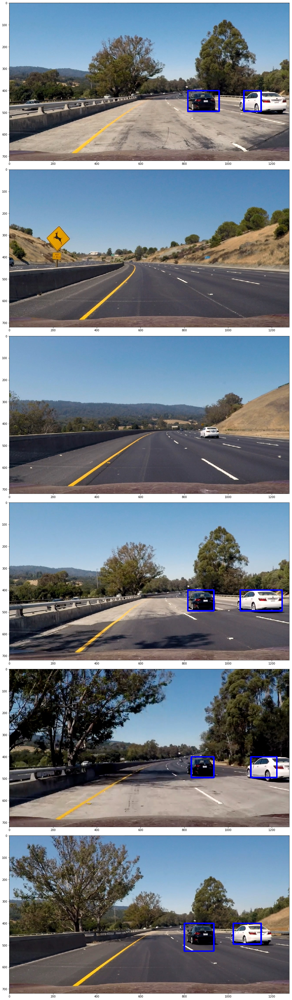

In [17]:
f, plots = plt.subplots(6, 1, figsize=(50, 50))
f.tight_layout()

for i in range(6):
    plots[i].imshow(pipeline(mpimg.imread('./test_images/test{}.jpg'.format(i+1)), 1))

In [18]:
class Vehicle_Detector:
    
    def __init__(self):
        self._mem = []
        
    def process(self, img):
        return pipeline(img, len(self._mem) // 2 + 5, self)
    
    def add_boxes(self, boxes):
        self._mem.append(boxes)
        if len(self._mem) > 15:
            del self._mem[0]

In [19]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

detector = Vehicle_Detector()

output = 'project_out.mp4'
clip = VideoFileClip('project_video.mp4')
result = clip.fl_image(detector.process)

result.write_videofile(output, audio=False)

[MoviePy] >>>> Building video project_out.mp4
[MoviePy] Writing video project_out.mp4


100%|█████████▉| 1260/1261 [10:05<00:00,  2.08it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_out.mp4 



In [20]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))